In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from datetime import datetime as dt 

In [2]:
data = pd.read_csv("booking_train_set.csv", index_col=0)
data.shape

(1166835, 9)

In [3]:
data.head(10)

,user_id,checkin,checkout,city_id,device_class,affiliate_id,booker_country,hotel_country,utrip_id
0,1006220,2016-04-09,2016-04-11,31114,desktop,384,Gondal,Gondal,1006220_1
1,1006220,2016-04-11,2016-04-12,39641,desktop,384,Gondal,Gondal,1006220_1
2,1006220,2016-04-12,2016-04-16,20232,desktop,384,Gondal,Glubbdubdrib,1006220_1
3,1006220,2016-04-16,2016-04-17,24144,desktop,384,Gondal,Gondal,1006220_1
4,1010293,2016-07-09,2016-07-10,5325,mobile,359,The Devilfire Empire,Cobra Island,1010293_1
5,1010293,2016-07-10,2016-07-11,55,mobile,359,The Devilfire Empire,Cobra Island,1010293_1
6,1010293,2016-07-12,2016-07-13,23921,mobile,359,The Devilfire Empire,Cobra Island,1010293_1
7,1010293,2016-07-13,2016-07-15,65322,desktop,9924,The Devilfire Empire,Cobra Island,1010293_1
8,1010293,2016-07-15,2016-07-16,23921,desktop,9924,The Devilfire Empire,Cobra Island,1010293_1
9,1010293,2016-07-16,2016-07-17,20545,desktop,10573,The Devilfire Empire,Cobra Island,1010293_1


In [4]:
data.tail()

,user_id,checkin,checkout,city_id,device_class,affiliate_id,booker_country,hotel_country,utrip_id
1166830,999261,2016-09-13,2016-09-15,14197,tablet,10332,Gondal,Fook Island,999261_1
1166831,999755,2016-12-13,2016-12-16,4476,desktop,2661,The Devilfire Empire,Gondal,999755_1
1166832,999755,2016-12-16,2016-12-17,1034,desktop,7974,The Devilfire Empire,Gondal,999755_1
1166833,999755,2016-12-22,2016-12-25,64876,desktop,7974,The Devilfire Empire,Fook Island,999755_1
1166834,999755,2016-12-25,2016-12-28,9608,desktop,9924,The Devilfire Empire,Fook Island,999755_1


In [5]:
data.columns

Index(['user_id', 'checkin', 'checkout', 'city_id', 'device_class',
       'affiliate_id', 'booker_country', 'hotel_country', 'utrip_id'],
      dtype='object')

In [6]:
#Find columns with Nans 
print("Columns with missing value: ")
print(data.columns[data.isnull().any()].tolist())

Columns with missing value: 
[]


In [7]:
print(data.isnull().sum())

user_id           0
checkin           0
checkout          0
city_id           0
device_class      0
affiliate_id      0
booker_country    0
hotel_country     0
utrip_id          0
dtype: int64


In [8]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1166835 entries, 0 to 1166834
Data columns (total 9 columns):
 #   Column          Non-Null Count    Dtype 
---  ------          --------------    ----- 
 0   user_id         1166835 non-null  int64 
 1   checkin         1166835 non-null  object
 2   checkout        1166835 non-null  object
 3   city_id         1166835 non-null  int64 
 4   device_class    1166835 non-null  object
 5   affiliate_id    1166835 non-null  int64 
 6   booker_country  1166835 non-null  object
 7   hotel_country   1166835 non-null  object
 8   utrip_id        1166835 non-null  object
dtypes: int64(3), object(6)
memory usage: 89.0+ MB


In [9]:
print("Unique Vaue Count: ")
cols = data.columns.tolist()
for col in cols:
    print(col+ " = " + str(len(data[col].unique())))

Unique Vaue Count: 
user_id = 200153
checkin = 425
checkout = 425
city_id = 39901
device_class = 3
affiliate_id = 3254
booker_country = 5
hotel_country = 195
utrip_id = 217686


In [10]:
data.describe()

,user_id,city_id,affiliate_id
count,1.166835e+06,1.166835e+06,1.166835e+06
mean,3.129535e+06,3.347059e+04,5.719503e+03
std,1.808045e+06,1.958255e+04,3.964435e+03
min,2.900000e+01,2.000000e+00,5.000000e+00
25%,1.562185e+06,1.701300e+04,9.340000e+02
50%,3.126222e+06,3.228200e+04,6.309000e+03
75%,4.701432e+06,5.112800e+04,9.924000e+03
max,6.258087e+06,6.756500e+04,1.069700e+04


In [11]:
data.loc[data['utrip_id'] == '999755_1']  #So. they visited two different cities in Gondal and another two in Fook Island since city_id is different and so are the check in and check out dates.

,user_id,checkin,checkout,city_id,device_class,affiliate_id,booker_country,hotel_country,utrip_id
1166831,999755,2016-12-13,2016-12-16,4476,desktop,2661,The Devilfire Empire,Gondal,999755_1
1166832,999755,2016-12-16,2016-12-17,1034,desktop,7974,The Devilfire Empire,Gondal,999755_1
1166833,999755,2016-12-22,2016-12-25,64876,desktop,7974,The Devilfire Empire,Fook Island,999755_1
1166834,999755,2016-12-25,2016-12-28,9608,desktop,9924,The Devilfire Empire,Fook Island,999755_1


In [12]:
#print ('Current date/time: {}'.format(dt.now()))
checkin = pd.to_datetime(data['checkin'],format='%Y-%m-%d')
checkout = pd.to_datetime(data['checkout'],format='%Y-%m-%d')

data['duration'] = checkout - checkin
#data['month'] = pd.to_datetime(data['checkout'],format='%m')
#data['year'] = pd.to_datetime(data['checkout'],format='%Y')

data.head(10)

,user_id,checkin,checkout,city_id,device_class,affiliate_id,booker_country,hotel_country,utrip_id,duration
0,1006220,2016-04-09,2016-04-11,31114,desktop,384,Gondal,Gondal,1006220_1,2 days
1,1006220,2016-04-11,2016-04-12,39641,desktop,384,Gondal,Gondal,1006220_1,1 days
2,1006220,2016-04-12,2016-04-16,20232,desktop,384,Gondal,Glubbdubdrib,1006220_1,4 days
3,1006220,2016-04-16,2016-04-17,24144,desktop,384,Gondal,Gondal,1006220_1,1 days
4,1010293,2016-07-09,2016-07-10,5325,mobile,359,The Devilfire Empire,Cobra Island,1010293_1,1 days
5,1010293,2016-07-10,2016-07-11,55,mobile,359,The Devilfire Empire,Cobra Island,1010293_1,1 days
6,1010293,2016-07-12,2016-07-13,23921,mobile,359,The Devilfire Empire,Cobra Island,1010293_1,1 days
7,1010293,2016-07-13,2016-07-15,65322,desktop,9924,The Devilfire Empire,Cobra Island,1010293_1,2 days
8,1010293,2016-07-15,2016-07-16,23921,desktop,9924,The Devilfire Empire,Cobra Island,1010293_1,1 days
9,1010293,2016-07-16,2016-07-17,20545,desktop,10573,The Devilfire Empire,Cobra Island,1010293_1,1 days


In [17]:
##Local tourists
localData = data.loc[data['hotel_country']==data['booker_country']]
localData.head(20)

,user_id,checkin,checkout,city_id,device_class,affiliate_id,booker_country,hotel_country,utrip_id,duration
0,1006220,2016-04-09,2016-04-11,31114,desktop,384,Gondal,Gondal,1006220_1,2 days
1,1006220,2016-04-11,2016-04-12,39641,desktop,384,Gondal,Gondal,1006220_1,1 days
3,1006220,2016-04-16,2016-04-17,24144,desktop,384,Gondal,Gondal,1006220_1,1 days
37,1047687,2016-08-21,2016-08-22,67353,mobile,8132,Elbonia,Elbonia,1047687_3,1 days
38,1047687,2016-08-22,2016-08-23,14145,mobile,8132,Elbonia,Elbonia,1047687_3,1 days
39,1047687,2016-08-23,2016-08-24,11531,mobile,8132,Elbonia,Elbonia,1047687_3,1 days
40,1047687,2016-08-24,2016-08-25,57167,mobile,9924,Elbonia,Elbonia,1047687_3,1 days
41,1047687,2016-08-25,2016-08-26,29770,mobile,9924,Elbonia,Elbonia,1047687_3,1 days
57,106415,2016-05-10,2016-05-11,36063,mobile,5755,Gondal,Gondal,106415_10,1 days
58,106415,2016-05-11,2016-05-12,36063,mobile,9598,Gondal,Gondal,106415_10,1 days


In [24]:
localData.shape

(111890, 10)

In [13]:
#non local tourists
nonLocalData = data.loc[data['hotel_country']!=data['booker_country']]
nonLocalData.head(10)

,user_id,checkin,checkout,city_id,device_class,affiliate_id,booker_country,hotel_country,utrip_id,duration
2,1006220,2016-04-12,2016-04-16,20232,desktop,384,Gondal,Glubbdubdrib,1006220_1,4 days
4,1010293,2016-07-09,2016-07-10,5325,mobile,359,The Devilfire Empire,Cobra Island,1010293_1,1 days
5,1010293,2016-07-10,2016-07-11,55,mobile,359,The Devilfire Empire,Cobra Island,1010293_1,1 days
6,1010293,2016-07-12,2016-07-13,23921,mobile,359,The Devilfire Empire,Cobra Island,1010293_1,1 days
7,1010293,2016-07-13,2016-07-15,65322,desktop,9924,The Devilfire Empire,Cobra Island,1010293_1,2 days
8,1010293,2016-07-15,2016-07-16,23921,desktop,9924,The Devilfire Empire,Cobra Island,1010293_1,1 days
9,1010293,2016-07-16,2016-07-17,20545,desktop,10573,The Devilfire Empire,Cobra Island,1010293_1,1 days
10,1012680,2016-10-23,2016-10-25,37709,desktop,384,Gondal,Yerba,1012680_1,2 days
11,1012680,2016-10-25,2016-10-27,11837,desktop,384,Gondal,Panem,1012680_1,2 days
12,1012680,2016-10-27,2016-10-30,19626,desktop,384,Gondal,Yerba,1012680_1,3 days


In [14]:
data.groupby(data['hotel_country']==data['booker_country']).count()  ## total no. of entries: 1166835 (true+false)
                                                                     ##True: no. local tourists entries: 111890
                                                                     ##False: non -local tourists entries: 1054945 

,user_id,checkin,checkout,city_id,device_class,affiliate_id,booker_country,hotel_country,utrip_id,duration
False,1054945,1054945,1054945,1054945,1054945,1054945,1054945,1054945,1054945,1054945
True,111890,111890,111890,111890,111890,111890,111890,111890,111890,111890


In [15]:
data.groupby(['utrip_id']).count()   ##unique or no. of multi destination trips = 217686 or no. of unique users 

,user_id,checkin,checkout,city_id,device_class,affiliate_id,booker_country,hotel_country,duration
utrip_id,,,,,,,,,
1000027_1,4,4,4,4,4,4,4,4,4
1000033_1,5,5,5,5,5,5,5,5,5
1000045_1,7,7,7,7,7,7,7,7,7
1000083_1,4,4,4,4,4,4,4,4,4
100008_1,5,5,5,5,5,5,5,5,5
...,...,...,...,...,...,...,...,...,...
999776_1,4,4,4,4,4,4,4,4,4
999839_1,4,4,4,4,4,4,4,4,4
999842_1,4,4,4,4,4,4,4,4,4


In [18]:
#local tourists unique ids: unique no of trips
#local =pd.DataFrame()
local = localData['utrip_id'].unique()
#local
local_df = pd.DataFrame(local,columns=['utrip_id'])
local_df.head(10)

,utrip_id
0,1006220_1
1,1047687_3
2,106415_10
3,1118748_1
4,1182903_2
5,1318264_11
6,133917_7
7,136586_1
8,1483553_1
9,1505696_2


In [19]:
local_df.shape

(33920, 1)

In [20]:
####LOCAL TOURISTS####
localData['booker_country'].value_counts()    #local tourists mostly Gondal is the country and least from Tcherkistan

Gondal                  77574
Elbonia                 22972
The Devilfire Empire     4005
Bartovia                 3888
Tcherkistan              3451
Name: booker_country, dtype: int64

In [21]:
localData['city_id'].value_counts()   ##most visited city id 36063

36063    3694
44869    1147
58178    1028
44320     999
29770     986
         ... 
352         1
2401        1
10597       1
57724       1
28686       1
Name: city_id, Length: 9807, dtype: int64

In [29]:
#non local tourists unique ids: unique no of trips
non_local = nonLocalData['utrip_id'].unique()
#non_local
nonlocal_df = pd.DataFrame(non_local,columns=['utrip_id'])
nonlocal_df.head(10)

,utrip_id
0,1006220_1
1,1010293_1
2,1012680_1
3,1017326_1
4,1024544_2
5,103011_1
6,1032262_2
7,103327_1
8,1057628_1
9,1062443_1


In [30]:
nonlocal_df.shape

(199976, 1)

In [45]:
###NON LOCAL
nonLocalData['city_id'].value_counts()   ##most visited city id 47499

47499    11242
23921    10511
17013     9011
29319     8179
64876     7784
         ...  
51692        1
57833        1
35300        1
41441        1
2049         1
Name: city_id, Length: 34788, dtype: int64

In [47]:
nonLocalData['hotel_country'].value_counts()   ##tourists mostly stayed at Cobra Island

Cobra Island    137791
Fook Island     117717
Glubbdubdrib     74840
Borginia         45629
Kangan           44876
                 ...  
Buenaventura         1
Sardovia             1
Maltovia             1
Rhelasia             1
Nuevo Rico           1
Name: hotel_country, Length: 195, dtype: int64

In [49]:
nonLocalData['booker_country'].value_counts()   ##tourists mostly booked from Gondal

Gondal                  458462
The Devilfire Empire    282239
Elbonia                 212372
Tcherkistan              77122
Bartovia                 24750
Name: booker_country, dtype: int64

In [43]:
data.groupby(['booker_country'])
data.head(10)

,user_id,checkin,checkout,city_id,device_class,affiliate_id,booker_country,hotel_country,utrip_id
0,1006220,2016-04-09,2016-04-11,31114,desktop,384,Gondal,Gondal,1006220_1
1,1006220,2016-04-11,2016-04-12,39641,desktop,384,Gondal,Gondal,1006220_1
2,1006220,2016-04-12,2016-04-16,20232,desktop,384,Gondal,Glubbdubdrib,1006220_1
3,1006220,2016-04-16,2016-04-17,24144,desktop,384,Gondal,Gondal,1006220_1
4,1010293,2016-07-09,2016-07-10,5325,mobile,359,The Devilfire Empire,Cobra Island,1010293_1
5,1010293,2016-07-10,2016-07-11,55,mobile,359,The Devilfire Empire,Cobra Island,1010293_1
6,1010293,2016-07-12,2016-07-13,23921,mobile,359,The Devilfire Empire,Cobra Island,1010293_1
7,1010293,2016-07-13,2016-07-15,65322,desktop,9924,The Devilfire Empire,Cobra Island,1010293_1
8,1010293,2016-07-15,2016-07-16,23921,desktop,9924,The Devilfire Empire,Cobra Island,1010293_1
9,1010293,2016-07-16,2016-07-17,20545,desktop,10573,The Devilfire Empire,Cobra Island,1010293_1


In [5]:
country = ['Gondal','The Devilfire Empire','Elbonia','Tcherkistan','Bartovia']
gon = []
for i in data.index :
    if (data['booker_country'][i] ==  'Gondal'):
        gon.append(data['city_id'][i])
len(gon)

, 26235, 2538, 61133, 66648, 18417, 30520, 7852, 5797, 13471, 13471, 13471, 32565, 51259, 50682, 50682, 50682, 48311, 17870, 25701, 10873, 44320, 6456, 20499, 4604, 18083, 13530, 21480, 36805, 26235, 45030, 58910, 13150, 21555, 699, 55128, 64876, 38762, 17684, 40521, 3979, 10994, 8330, 41507, 53207, 51765, 44320, 23983, 62927, 27269, 26621, 40413, 24072, 36818, 28384, 40413, 25701, 23983, 28384, 47499, 34342, 57523, 4424, 34342, 60237, 28887, 47499, 48681, 49063, 30991, 47208, 25429, 34140, 12594, 54710, 27269, 23983, 36818, 44320, 58178, 36063, 36063, 36063, 36063, 36063, 36063, 36063, 3505, 44486, 15255, 60604, 61320, 52571, 67102, 61428, 51291, 66648, 3763, 58178, 36905, 27404, 27404, 31577, 27404, 10410, 47499, 47499, 27112, 17764, 13530, 33635, 54154, 21480, 36805, 11460, 63812, 26235, 13530, 19511, 61320, 52571, 66809, 29829, 62868, 6327, 61320, 20967, 65856, 60328, 60328, 47976, 47976, 37761, 5489, 15990, 2612, 47976, 37874, 55330, 8354, 47976, 2416, 18735, 48928, 59168, 51211, 

In [46]:
data.groupby(['hotel_country'])
data.head(10)

,user_id,checkin,checkout,city_id,device_class,affiliate_id,booker_country,hotel_country,utrip_id
0,1006220,2016-04-09,2016-04-11,31114,desktop,384,Gondal,Gondal,1006220_1
1,1006220,2016-04-11,2016-04-12,39641,desktop,384,Gondal,Gondal,1006220_1
2,1006220,2016-04-12,2016-04-16,20232,desktop,384,Gondal,Glubbdubdrib,1006220_1
3,1006220,2016-04-16,2016-04-17,24144,desktop,384,Gondal,Gondal,1006220_1
4,1010293,2016-07-09,2016-07-10,5325,mobile,359,The Devilfire Empire,Cobra Island,1010293_1
5,1010293,2016-07-10,2016-07-11,55,mobile,359,The Devilfire Empire,Cobra Island,1010293_1
6,1010293,2016-07-12,2016-07-13,23921,mobile,359,The Devilfire Empire,Cobra Island,1010293_1
7,1010293,2016-07-13,2016-07-15,65322,desktop,9924,The Devilfire Empire,Cobra Island,1010293_1
8,1010293,2016-07-15,2016-07-16,23921,desktop,9924,The Devilfire Empire,Cobra Island,1010293_1
9,1010293,2016-07-16,2016-07-17,20545,desktop,10573,The Devilfire Empire,Cobra Island,1010293_1


Grouping cityIds basedon booker country

NOW USING THE REARRANGED DATA

In [3]:
redata = pd.read_csv("rearranged_train_data.csv", index_col=0)
redata.shape

(217686, 7)

In [3]:
redata.head(10)

,user_id,citiesvisited,citiespertrip,countriesvisited,countriespertrip,internationaltrip,lengthofstay
utrip_id,,,,,,,
1000027_1,1000027,"[15626, 30628, 60902, 8183]",4,['Gondal'],1,False,8
1000033_1,1000033,"[21328, 52089, 27485, 38677]",4,['Cobra Island'],1,False,10
1000045_1,1000045,"[58178, 9608, 31817, 36170, 64876, 55128, 36063]",7,"['Carpathia', 'Fook Island', 'Gondal']",3,True,11
1000083_1,1000083,"[35160, 14705, 55990, 36063]",4,"['Gondal', 'Osterlich']",2,True,5
100008_1,100008,"[12096, 6761, 11306, 65690, 6779]",5,['Kamistan'],1,False,9
1000097_1,1000097,"[6306, 61187, 6788, 17127, 42503, 40521, 21033...",9,['Fook Island'],1,False,16
1000136_1,1000136,"[33540, 62541, 42482, 32627, 20345]",5,['Fook Island'],1,False,15
1000145_1,1000145,"[17764, 27112, 35850, 56651, 47499]",5,"['Rook Islands', 'Kangan']",2,True,13
100018_1,100018,"[5797, 17830, 46854, 22065, 57619, 57658, 2748]",7,"['Urkesh', 'Bartovia', 'Leutonia']",3,True,14


In [6]:
redata.sort_values(['citiespertrip'],ascending=[True])

,user_id,citiesvisited,citiespertrip,countriesvisited,countriespertrip,internationaltrip,lengthofstay
utrip_id,,,,,,,
3872807_2,3872807,[3763],1,['Glubbdubdrib'],1,False,13
2990805_2,2990805,[51259],1,['Oceania'],1,False,9
54181_1,54181,[52815],1,['Aldovia'],1,False,6
433188_10,433188,[26951],1,['Elbonia'],1,False,11
5342852_1,5342852,[10485],1,['Kangan'],1,False,5
...,...,...,...,...,...,...,...
1380626_3,1380626,"[7042, 57988, 60946, 41620, 56600, 67353, 5519...",33,"['Cobra Island', 'Pokrovia', 'Aslerfan', 'Bart...",9,True,45
3422831_1,3422831,"[1157, 46088, 46223, 4369, 22545, 56465, 13209...",35,['Kasnia'],1,False,78
2899950_1,2899950,"[14721, 16642, 40325, 55055, 5400, 58394, 5199...",37,"['Norland', 'Patusan']",2,True,51


In [7]:
redata.sort_values(['countriespertrip'],ascending=[True])

,user_id,citiesvisited,citiespertrip,countriesvisited,countriespertrip,internationaltrip,lengthofstay
utrip_id,,,,,,,
1000027_1,1000027,"[15626, 30628, 60902, 8183]",4,['Gondal'],1,False,8
4459579_1,4459579,"[9680, 17013, 60222]",3,['Borginia'],1,False,8
4459813_1,4459813,"[48968, 27404, 32821]",3,['Cobra Island'],1,False,14
4459869_1,4459869,"[19448, 26436, 2813, 50829]",4,['Nova Africa'],1,False,4
4459873_2,4459873,"[4128, 51685, 52933, 46411, 47759, 55990, 41113]",7,['Osterlich'],1,False,9
...,...,...,...,...,...,...,...
2305747_1,2305747,"[5797, 17158, 46854, 67144, 57658, 64876, 6167...",14,"['Trans-Carpathia', 'Urkesh', 'Palombia', 'San...",11,True,57
4095271_3,4095271,"[33667, 53859, 45188, 56198, 62185, 23243, 185...",13,"['Carpathia', 'Novistrana', 'Pokrovia', 'San S...",11,True,27
406864_3,406864,"[13059, 56198, 59535, 10273, 26277, 33830, 209...",21,"['Novistrana', 'Fook Island', 'Glubbdubdrib', ...",12,True,21


In [8]:
redata.sort_values(['lengthofstay'],ascending=[True])

,user_id,citiesvisited,citiespertrip,countriesvisited,countriespertrip,internationaltrip,lengthofstay
utrip_id,,,,,,,
5549386_1,5549386,[950],1,['Pullamawang'],1,False,1
5195238_7,5195238,[30520],1,['Glubbdubdrib'],1,False,1
4571597_2,4571597,[25279],1,['Glubbdubdrib'],1,False,1
4524407_2,4524407,[29450],1,['Elbonia'],1,False,1
3660133_2,3660133,[19405],1,['Borginia'],1,False,1
...,...,...,...,...,...,...,...
3274842_1,3274842,"[14657, 22196]",2,['Gondal'],1,False,106
5648237_1,5648237,[51765],1,['Nevoruss'],1,False,110
3762669_3,3762669,[51259],1,['Oceania'],1,False,120


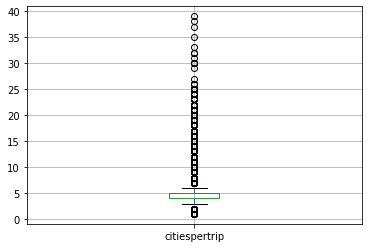

In [10]:
##Viewing any outliers
redata.boxplot(column=['citiespertrip'])

In [11]:
redata['citiespertrip'].quantile([0.25,0.5,0.75])

0.25    4.0
0.50    4.0
0.75    5.0
Name: citiespertrip, dtype: float64

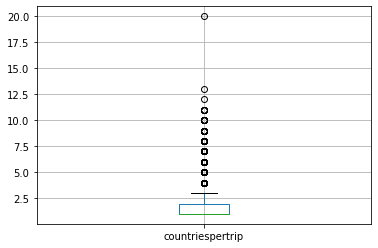

In [13]:
#outlier with 20 countries per trip
redata.boxplot(column=['countriespertrip'])

In [16]:
redata['countriespertrip'].quantile([0.25,0.5,0.75])

0.25    1.0
0.50    1.0
0.75    2.0
Name: countriespertrip, dtype: float64

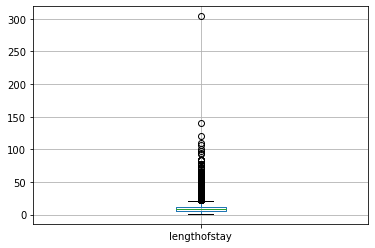

In [17]:
#outlier at 300 days of stay
redata.boxplot(column=['lengthofstay'])

In [18]:
redata['lengthofstay'].quantile([0.25,0.5,0.75])

0.25     6.0
0.50     8.0
0.75    12.0
Name: lengthofstay, dtype: float64

*****Here, replacing outliers with possible values(IQR,etc) has to be done...I haven't made any changes to the data*****

In [14]:
redata["countriesvisited"] = redata["countriesvisited"].apply(eval)

In [13]:
redata.head()

,user_id,citiesvisited,citiespertrip,countriesvisited,countriespertrip,internationaltrip,lengthofstay
utrip_id,,,,,,,
1000027_1,1000027,"[15626, 30628, 60902, 8183]",4,[Gondal],1,False,8
1000033_1,1000033,"[21328, 52089, 27485, 38677]",4,[Cobra Island],1,False,10
1000045_1,1000045,"[58178, 9608, 31817, 36170, 64876, 55128, 36063]",7,"[Carpathia, Fook Island, Gondal]",3,True,11
1000083_1,1000083,"[35160, 14705, 55990, 36063]",4,"[Gondal, Osterlich]",2,True,5
100008_1,100008,"[12096, 6761, 11306, 65690, 6779]",5,[Kamistan],1,False,9


In [34]:
redata.info()

<class 'pandas.core.frame.DataFrame'>
Index: 217686 entries, 1000027_1 to 999944_1
Data columns (total 7 columns):
 #   Column             Non-Null Count   Dtype 
---  ------             --------------   ----- 
 0   user_id            217686 non-null  int64 
 1   citiesvisited      217686 non-null  object
 2   citiespertrip      217686 non-null  int64 
 3   countriesvisited   217686 non-null  object
 4   countriespertrip   217686 non-null  int64 
 5   internationaltrip  217686 non-null  bool  
 6   lengthofstay       217686 non-null  int64 
dtypes: bool(1), int64(4), object(2)
memory usage: 11.8+ MB


In [10]:
#getting unique value or valucounts
def to_1D(series):
 return pd.Series([x for _list in series for x in _list])

unique_items = to_1D(redata['countriesvisited']).value_counts()
unique_items

'    615518
a    410889
n    255018
o    226423
[    217686
      ...  
î        38
(        25
)        25
é        18
.        16
Length: 65, dtype: int64

Text(0.5, 1.0, 'Countires Visited')

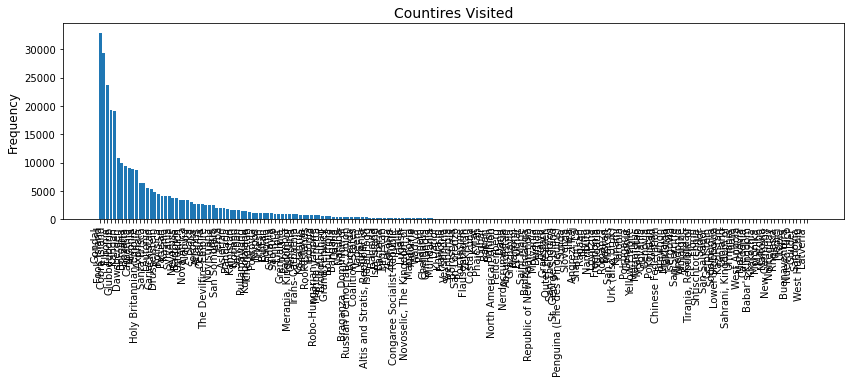

In [17]:
fig, ax = plt.subplots(figsize = (14,4))
fig.autofmt_xdate(rotation=90)
ax.bar(to_1D(redata['countriesvisited']).value_counts().index,
        to_1D(redata['countriesvisited']).value_counts().values)
ax.set_ylabel("Frequency", size = 12)
ax.set_title("Countires Visited", size = 14)

 *Individual Columns for All Unique Values*
 

In [20]:
def boolean_df(item_lists, unique_items):
# Create empty dict
    bool_dict = {}
    
    # Loop through all the tags
    for i, item in enumerate(unique_items):
        
        # Apply boolean mask
        bool_dict[item] = item_lists.apply(lambda x: item in x)
            
    # Return the results as a dataframe
    return pd.DataFrame(bool_dict)


countries_bool = boolean_df(redata['countriesvisited'], unique_items.keys())

In [21]:
countries_bool

,Gondal,Fook Island,Cobra Island,Elbonia,Glubbdubdrib,Kangan,Dawsbergen,Borginia,Bozatta,Carpathia,...,Norteguay,Rhelasia,Medici,Utopia,Buenaventura,Nuevo Rico,Guilder,Sardovia,West Hun Chiu,Latveria
utrip_id,,,,,,,,,,,,,,,,,,,,,
1000027_1,True,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1000033_1,False,False,True,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1000045_1,True,True,False,False,False,False,False,False,False,True,...,False,False,False,False,False,False,False,False,False,False
1000083_1,True,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
100008_1,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
999776_1,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
999839_1,False,False,True,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
999842_1,False,False,False,False,True,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False


Another way is to simply count how many times a country was named alongside all other country. This can be solved using matrix multiplication. For this, we will need to convert the boolean dataframe to an integer based on first.


In [25]:
countriesvisited_int = countries_bool.astype(int)
countries_freq_mat = np.dot(countriesvisited_int.T, countriesvisited_int)
countries_freq_mat

array([[32928,  5990,   399, ...,     0,     0,     0],
       [ 5990, 29385,    19, ...,     0,     0,     0],
       [  399,    19, 23755, ...,     1,     0,     0],
       ...,
       [    0,     0,     1, ...,     1,     0,     0],
       [    0,     0,     0, ...,     0,     1,     0],
       [    0,     0,     0, ...,     0,     0,     1]])

All we need to do now is add labels and transform it back to a dataframe

In [28]:
countries_freq = pd.DataFrame(countries_freq_mat, columns = unique_items.keys(), index = unique_items.keys())
countries_freq.head(10)

,Gondal,Fook Island,Cobra Island,Elbonia,Glubbdubdrib,Kangan,Dawsbergen,Borginia,Bozatta,Carpathia,...,Norteguay,Rhelasia,Medici,Utopia,Buenaventura,Nuevo Rico,Guilder,Sardovia,West Hun Chiu,Latveria
Gondal,32928,5990,399,4099,4789,85,1437,33,918,3810,...,0,0,0,0,0,0,0,0,0,0
Fook Island,5990,29385,19,3271,1125,6,2734,10,263,3475,...,0,0,1,0,0,0,0,0,0,0
Cobra Island,399,19,23755,187,39,2,9,19,55,15,...,0,0,0,0,0,0,0,1,0,0
Elbonia,4099,3271,187,19362,670,11,5543,13,354,3594,...,0,0,0,0,0,0,0,1,0,0
Glubbdubdrib,4789,1125,39,670,19017,8,173,8,153,381,...,0,0,0,0,0,0,0,0,0,0
Kangan,85,6,2,11,8,10717,2,50,3,1,...,0,0,0,0,0,0,0,0,0,0
Dawsbergen,1437,2734,9,5543,173,2,9913,0,72,2032,...,0,0,0,0,0,0,0,0,0,0
Borginia,33,10,19,13,8,50,0,9471,5,2,...,0,0,0,0,0,0,0,0,0,0
Bozatta,918,263,55,354,153,3,72,5,9066,189,...,0,0,0,0,0,0,0,0,0,0
Carpathia,3810,3475,15,3594,381,1,2032,2,189,8880,...,0,0,0,0,0,0,0,0,0,0


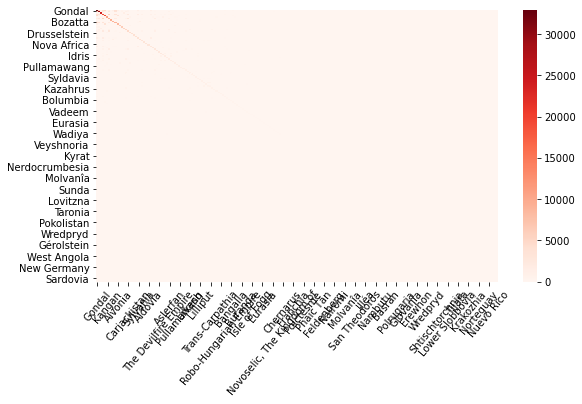

In [31]:
fig, ax = plt.subplots(figsize = (9,5))
sns.heatmap(countries_freq, cmap = "Reds")
plt.xticks(rotation=50)
plt.savefig("heatmap.png", dpi = 300)